In [2]:
import requests
import geopandas as gpd
import pandas
from bs4 import BeautifulSoup
from urllib.request import urlopen
import zipfile
import fiona 
import re
from io import BytesIO
import os
import calendar
import glob

In [16]:

x = requests.get('http://xjubier.free.fr/en/site_pages/SolarEclipsesGoogleEarth.html')

print(x.text)

<!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 4.01 Transitional//EN" "http://www.w3.org/TR/html4/loose.dtd">
<html lang="en-US">

<head>
 <meta http-equiv="Content-Type" content="text/html; charset=iso-8859-1">
 <meta http-equiv="Window-target" content="_top">
 <meta http-equiv="Author" content="Xavier Jubier">
 <meta http-equiv="Content-Language" content="en">
<!--[if IE]>
 <meta http-equiv="X-UA-Compatible" content="IE=edge">
<![endif]-->

 <meta name="copyright" content="1991-2022 by Xavier M. Jubier">
 <meta name="expires" content="never">
 <meta name="revisit-after" content="7 days">
 <meta name="robots" content="index,follow">
 <meta name="author" content="Xavier Jubier">
 <meta name="MSSmartTagsPreventParsing" content="true">
 <meta name="subject" content="'Google Earth files for solar eclipses' page">
 <meta name="rating" content="general">
 <meta name="keywords" content="Eclipse, Google, Earth, file, kml, kmz, sun, solar, aurora, Jubier">
 <meta name="description" content="Solar Ecl

# Concatenaing URL download link and URL web address

In [17]:
html = requests.get("http://xjubier.free.fr/en/site_pages/SolarEclipsesGoogleEarth.html").text
soup = BeautifulSoup(html)

print(soup.find("p", class_="PresentationNarrowRight"))

<p class="PresentationNarrowRight">
<font class="li2">Total on <a class="li2" href="../../download/GE/en/TSE_1961_02_15.kmz" title="Total Solar Eclipse 1961 Google Earth">Wednesday, February 15, 1961</a></font>
<br/>
<font class="li2">Total on <a class="li2" href="../../download/GE/en/TSE_1968_09_22.kmz" title="Total Solar Eclipse 1968 Google Earth">Sunday, September 22, 1968</a></font>
<br/>
<font class="li2">Total on <a class="li2" href="../../download/GE/en/TSE_1970_03_07.kmz" title="Total Solar Eclipse 1970 Google Earth">Saturday, March 7, 1970</a></font>
<br/>
<font class="li2">Total on <a class="li2" href="../../download/GE/en/TSE_1972_07_10.kmz" title="Total Solar Eclipse 1972 Google Earth">Monday, July 10, 1972</a></font>
<br/>
<font class="li2">Total on <a class="li2" href="../../download/GE/en/TSE_1973_06_30.kmz" title="Total Solar Eclipse 1973 Google Earth">Saturday, June 30, 1973</a></font>
<br/>
<font class="li2">Total on <a class="li2" href="../../download/GE/en/TSE_1979_

In [18]:
text = soup.find("p", class_="PresentationNarrowRight")
text

<p class="PresentationNarrowRight">
<font class="li2">Total on <a class="li2" href="../../download/GE/en/TSE_1961_02_15.kmz" title="Total Solar Eclipse 1961 Google Earth">Wednesday, February 15, 1961</a></font>
<br/>
<font class="li2">Total on <a class="li2" href="../../download/GE/en/TSE_1968_09_22.kmz" title="Total Solar Eclipse 1968 Google Earth">Sunday, September 22, 1968</a></font>
<br/>
<font class="li2">Total on <a class="li2" href="../../download/GE/en/TSE_1970_03_07.kmz" title="Total Solar Eclipse 1970 Google Earth">Saturday, March 7, 1970</a></font>
<br/>
<font class="li2">Total on <a class="li2" href="../../download/GE/en/TSE_1972_07_10.kmz" title="Total Solar Eclipse 1972 Google Earth">Monday, July 10, 1972</a></font>
<br/>
<font class="li2">Total on <a class="li2" href="../../download/GE/en/TSE_1973_06_30.kmz" title="Total Solar Eclipse 1973 Google Earth">Saturday, June 30, 1973</a></font>
<br/>
<font class="li2">Total on <a class="li2" href="../../download/GE/en/TSE_1979_

# Strip the dates

In [19]:
url = "http://xjubier.free.fr/download/GE/en/"
kmz_extension = ".kmz"

In [20]:
path = "D:\Side Projects\Map Portfolio\Map 22 Eclipses"
directory = os.listdir(path)

# Lookk for the font element, and class 'li2'
for a in text.findAll('font', attrs={'class':'li2'}):
   # find the 'a' in the href element 
    href = a.find('a')['href']
    # then split the href link to grab the years
    href_split = href.split("en/")[1]
    #print(href_split)

    download_link = url + href_split
    # print(download_link)
    req = requests.get(download_link)
    
    zip_file = zipfile.ZipFile(BytesIO(req.content))
    zip_file.extractall(path)

    #kml_path = path + "/" + href_split
    # kml_file = kml_path.replace("kmz", "kml")
    # print(kml_file)
    
    #gdf = gpd.read_file(kml_file, driver="KML")
    
    # write geodataframe to shapefile
    #shp_file = path + "/" + href_split
    #shp_file = shp_file.replace("kmz", "shp")
    #gdf.to_file(shp_file, driver = 'ESRI Shapefile')
    



# convert KML to shapefiles

In [21]:
fiona.drvsupport.supported_drivers['libkml'] = 'rw' 
fiona.drvsupport.supported_drivers['LIBKML'] = 'rw'

In [22]:
string = re.sub("[^0-9] ", "", "2031 11 14.kml")
print(string.split(".")[0])

2031 11 14


In [36]:
## Counties

counties = gpd.read_file("D:\Side Projects\Map Portfolio\Map 22 Eclipses\Counties Data\c_19se23.shp")
counties


,STATE,CWA,COUNTYNAME,FIPS,TIME_ZONE,FE_AREA,LON,LAT,geometry
0,ME,CAR,Washington,23029,E,se,-67.6361,45.0363,"MULTIPOLYGON (((-67.93539 44.40382, -67.93643 ..."
1,GA,CHS,McIntosh,13191,E,se,-81.2646,31.5329,"MULTIPOLYGON (((-81.46814 31.33980, -81.46747 ..."
2,GA,CHS,Liberty,13179,E,se,-81.2103,31.7093,"POLYGON ((-81.30807 31.79454, -81.30546 31.791..."
3,CT,BOX,Hartford,09003,E,nn,-72.7328,41.8064,"POLYGON ((-72.89799 42.03781, -72.86250 42.037..."
4,CT,BOX,Tolland,09013,E,nn,-72.3365,41.8550,"POLYGON ((-72.50919 42.03411, -72.48330 42.033..."
...,...,...,...,...,...,...,...,...,...
3219,AK,AJK,Skagway,02230,A,NaN,-135.3379,59.5602,"POLYGON ((-135.02890 59.56367, -135.02760 59.4..."
3220,AK,AFC,Chugach,02063,A,NaN,-145.7945,60.7356,"MULTIPOLYGON (((-146.34290 59.40822, -146.3690..."
3221,AK,AFC,Copper River,02066,A,NaN,-143.9685,61.8843,"POLYGON ((-145.14890 63.22221, -145.14840 63.1..."
3222,AK,AJK,Petersburg Borough,02195,A,NaN,-132.9279,57.1338,"MULTIPOLYGON (((-133.48209 57.81878, -133.4795..."


<Axes: >

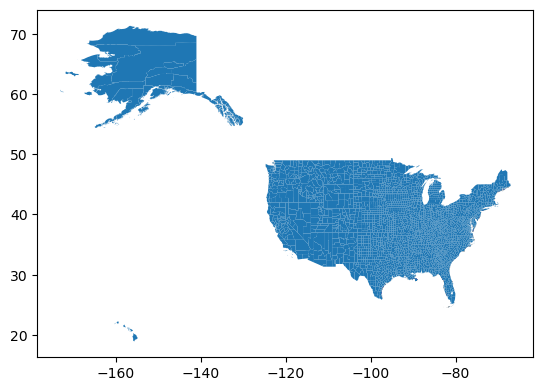

In [37]:
counties.plot()

In [38]:
counties_updated = counties[counties["STATE"].isin(["AK", "HI"]) == False]
counties_updated

,STATE,CWA,COUNTYNAME,FIPS,TIME_ZONE,FE_AREA,LON,LAT,geometry
0,ME,CAR,Washington,23029,E,se,-67.6361,45.0363,"MULTIPOLYGON (((-67.93539 44.40382, -67.93643 ..."
1,GA,CHS,McIntosh,13191,E,se,-81.2646,31.5329,"MULTIPOLYGON (((-81.46814 31.33980, -81.46747 ..."
2,GA,CHS,Liberty,13179,E,se,-81.2103,31.7093,"POLYGON ((-81.30807 31.79454, -81.30546 31.791..."
3,CT,BOX,Hartford,09003,E,nn,-72.7328,41.8064,"POLYGON ((-72.89799 42.03781, -72.86250 42.037..."
4,CT,BOX,Tolland,09013,E,nn,-72.3365,41.8550,"POLYGON ((-72.50919 42.03411, -72.48330 42.033..."
...,...,...,...,...,...,...,...,...,...
3190,TX,BRO,Willacy,48489,C,ds,-97.6732,26.4706,"MULTIPOLYGON (((-97.44247 26.37530, -97.44263 ..."
3191,MI,APX,Chippewa,26033,E,ee,-84.5921,46.3031,"MULTIPOLYGON (((-83.56822 45.92122, -83.56780 ..."
3192,OR,MFR,Curry,41015,P,sw,-124.1567,42.4578,"MULTIPOLYGON (((-124.47923 42.95568, -124.4762..."
3193,MD,LWX,Cecil,24015,E,ne,-76.0103,39.5606,"MULTIPOLYGON (((-75.81926 39.38305, -75.81705 ..."


<Axes: >

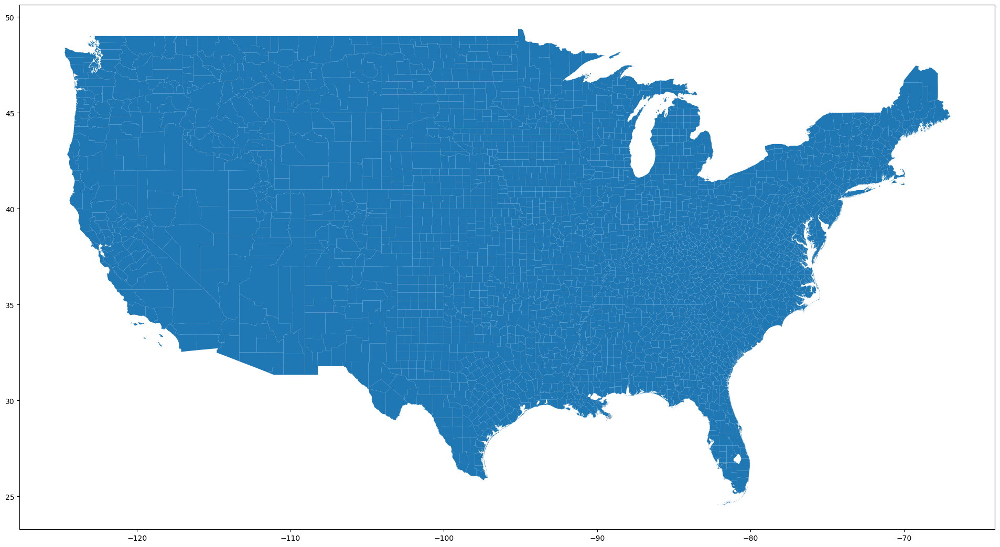

In [39]:
counties_updated.plot(figsize= (24,20))

<Axes: >

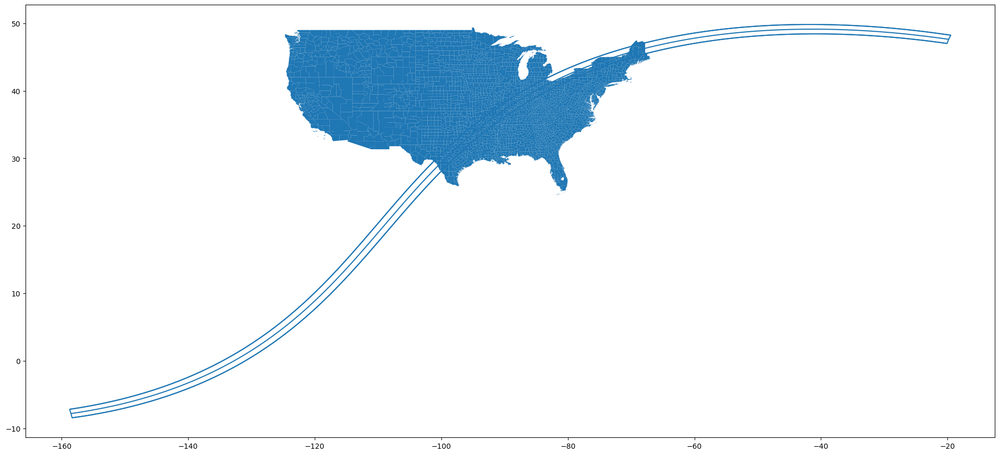

In [40]:
eclipse_24 = gpd.read_file("TSE_2024_04_08__5e21fbdbe2c4b.shp")
ax = counties_updated.plot(figsize= (24,20))
eclipse_24.plot(ax=ax)

In [41]:
counties_updated.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [42]:
counties_updated = counties_updated.to_crs("EPSG:4326")
counties_updated.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [43]:
eclipse_24.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [44]:
eclipse_17 = gpd.read_file("TSE_2017_08_21__51d815de77797.shp")
eclipse_2005 = gpd.read_file("TSE_2016_03_09__51d815bd9d113.shp")

<Axes: >

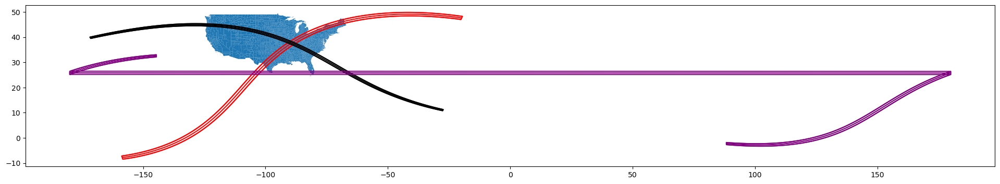

In [45]:
ax = counties_updated.plot(figsize= (24,20))
eclipse_24.plot(ax=ax, color="red")
eclipse_17.plot(ax=ax, color="black")
eclipse_2005.plot(ax=ax, color="purple")

C:\Users\luisg\anaconda3\Lib\site-packages\geopandas\plotting.py:675: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize)


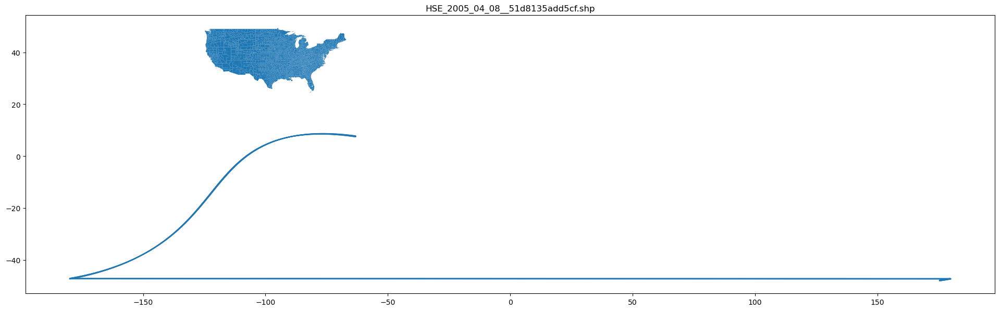

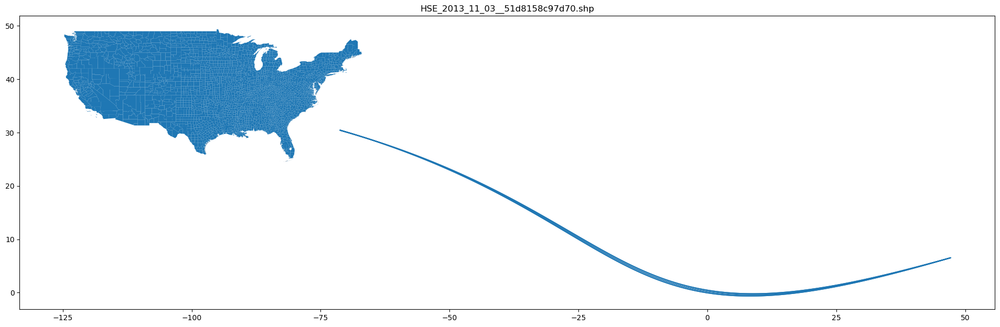

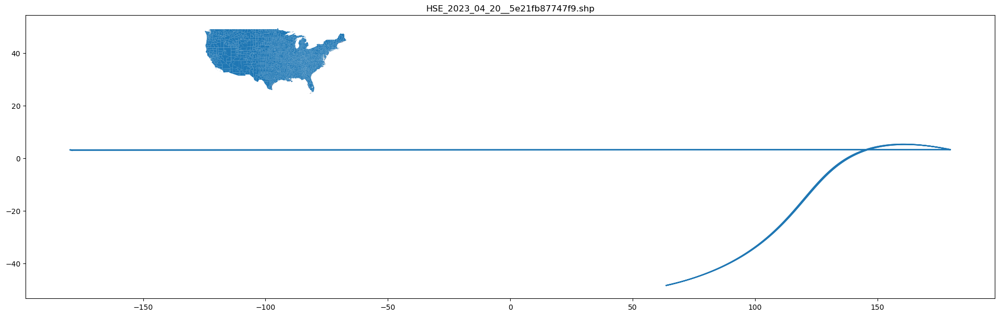

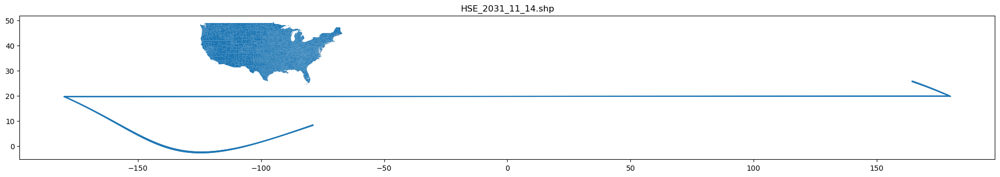

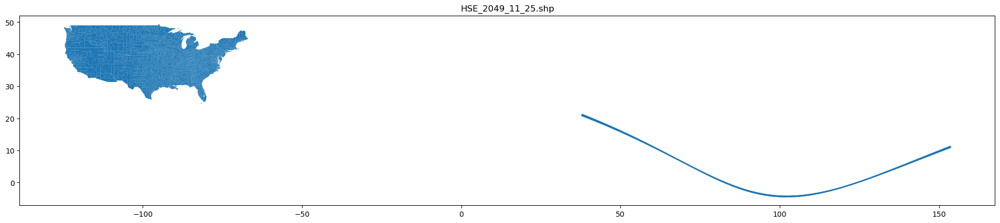

...

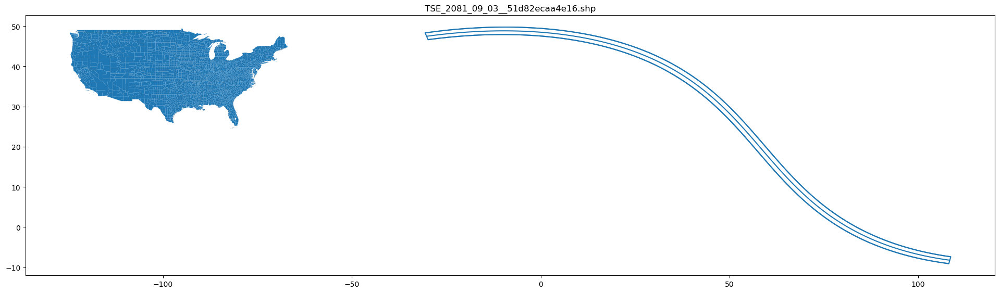

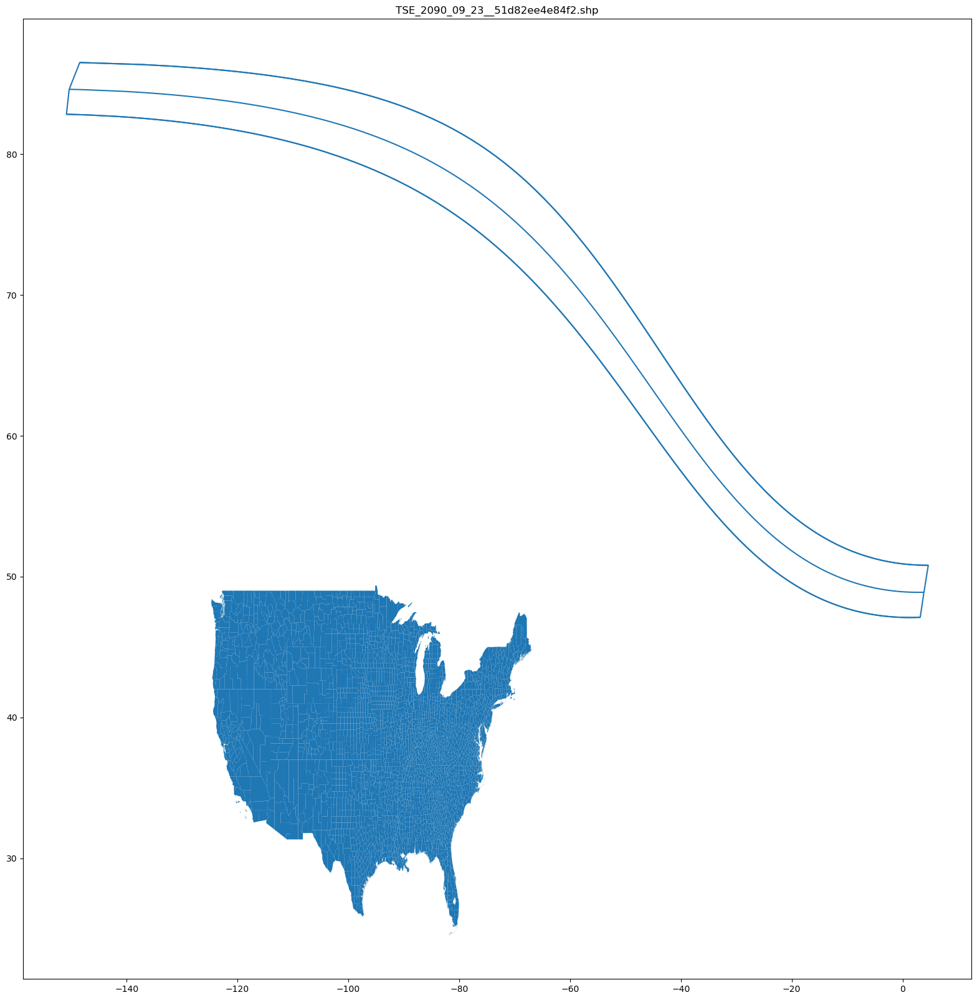

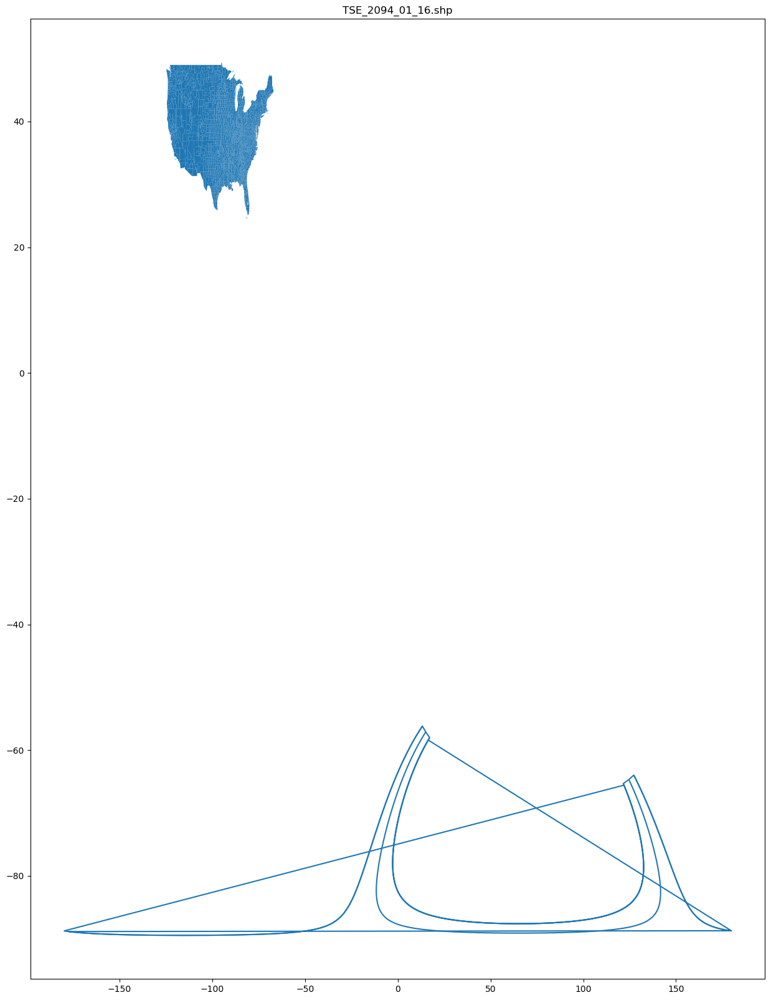

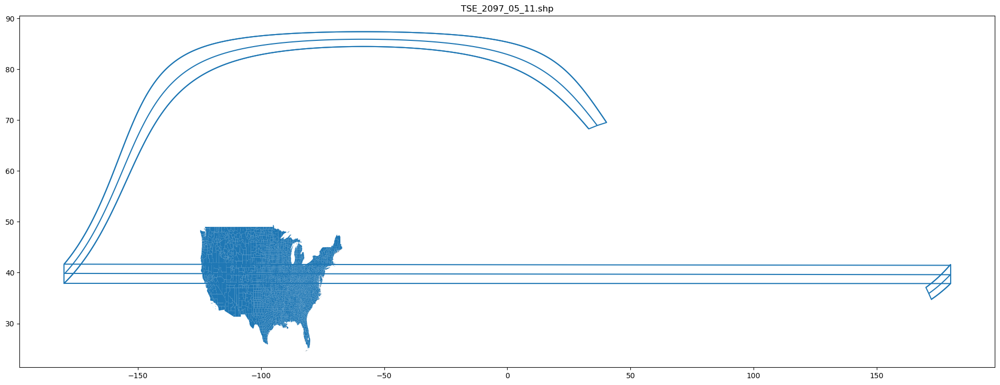

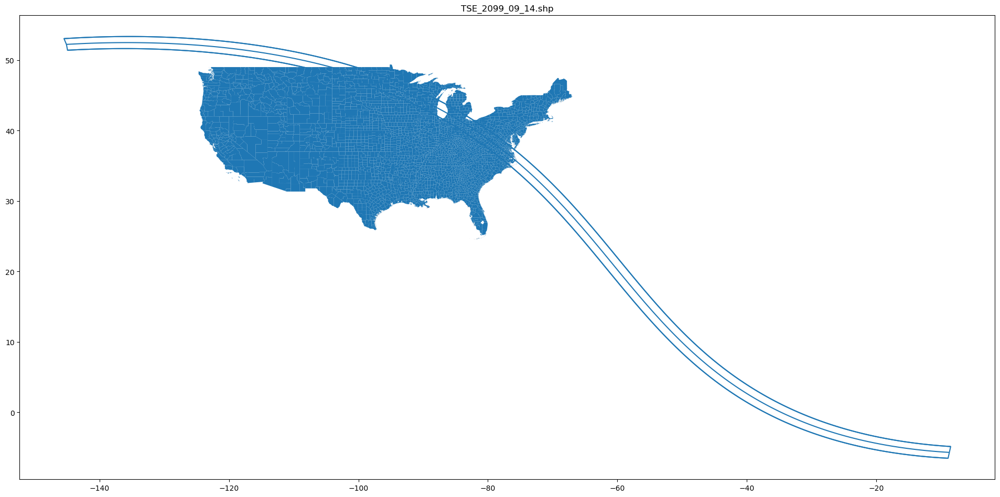

In [46]:

# giving directory name
dirname = "D:\Side Projects\Map Portfolio\Map 22 Eclipses"
 
# giving file extension
ext = ('.shp')
 
# iterating over all files
for files in os.listdir(dirname):
    if files.endswith(ext):
        file_name = files  # printing file name of desired extension
        
        
        eclipse_shp = gpd.read_file(file_name)
        ax = counties_updated.plot(figsize=(24,20))
        eclipse_shp.plot(ax=ax)
        ax.set_title(file_name)
        
    else:
        continue

In [ ]:
# Spatial Join example between one eclipse file and the north american counties


<Axes: >

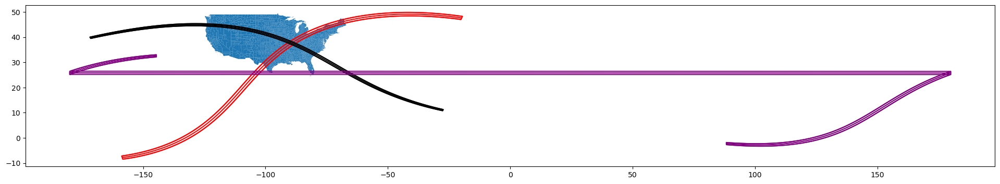

In [47]:
ax = counties_updated.plot(figsize= (24,20))
eclipse_24.plot(ax=ax, color="red")
eclipse_17.plot(ax=ax, color="black")
eclipse_2005.plot(ax=ax, color="purple")

In [1]:
# try converting line to polygon
eclipse_17_polygon = eclipse_17.envelope
eclipse_17_polygon.plot()

NameError: name 'eclipse_17' is not defined

<Axes: >

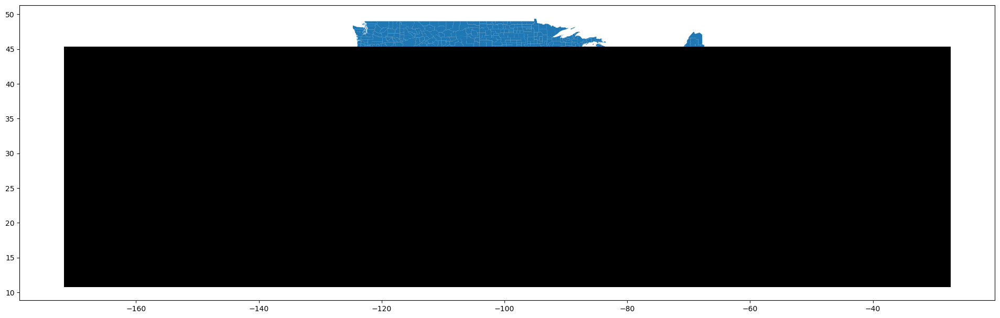

In [61]:
ax = counties_updated.plot(figsize= (24,20))

eclipse_17_polygon.plot(ax=ax, color="black")


In [53]:
eclipse_clip= gpd.sjoin(counties_updated, eclipse_17, op="intersects")
eclipse_clip

C:\Users\luisg\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py:3448: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,STATE,CWA,COUNTYNAME,FIPS,TIME_ZONE,FE_AREA,LON,LAT,geometry,index_right,Name,descriptio,altitudeMo,tessellate,extrude,visibility,drawOrder,icon
272,KY,LMK,Monroe,21171,C,sc,-85.7164,36.7122,"POLYGON ((-85.61310 36.83281, -85.60200 36.829...",3,Umbra,NaN,clampToGround,1,0,1,NaN,NaN
275,KY,PAH,Muhlenberg,21177,C,sc,-87.1421,37.2157,"POLYGON ((-87.10040 37.41571, -87.09890 37.414...",3,Umbra,NaN,clampToGround,1,0,1,NaN,NaN
278,KY,LMK,Ohio,21183,C,cc,-86.8490,37.4783,"POLYGON ((-86.63900 37.65641, -86.63989 37.638...",3,Umbra,NaN,clampToGround,1,0,1,NaN,NaN
299,KY,PAH,Union,21225,C,nw,-87.9453,37.6584,"POLYGON ((-87.82010 37.76831, -87.81640 37.765...",3,Umbra,NaN,clampToGround,1,0,1,NaN,NaN
300,KY,LMK,Warren,21227,C,sc,-86.4239,36.9936,"POLYGON ((-86.49250 37.18561, -86.48940 37.183...",3,Umbra,NaN,clampToGround,1,0,1,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2913,OR,PQR,Linn,41043,P,nw,-122.5342,44.4886,"POLYGON ((-122.74930 44.78771, -122.74329 44.7...",2,Southern Limit,NaN,clampToGround,1,0,1,NaN,NaN
2916,OR,PQR,Benton,41003,P,ww,-123.4292,44.4922,"POLYGON ((-123.14940 44.72051, -123.14750 44.7...",2,Southern Limit,NaN,clampToGround,1,0,1,NaN,NaN
2920,OR,PDT,Crook,41013,P,cc,-120.3566,44.1422,"POLYGON ((-120.38550 44.56391, -120.38670 44.5...",2,Southern Limit,NaN,clampToGround,1,0,1,NaN,NaN
2923,OR,PDT,Grant,41023,P,cc,-119.0074,44.4912,"POLYGON ((-118.88830 44.99821, -118.84390 44.9...",2,Southern Limit,NaN,clampToGround,1,0,1,NaN,NaN


<Axes: >

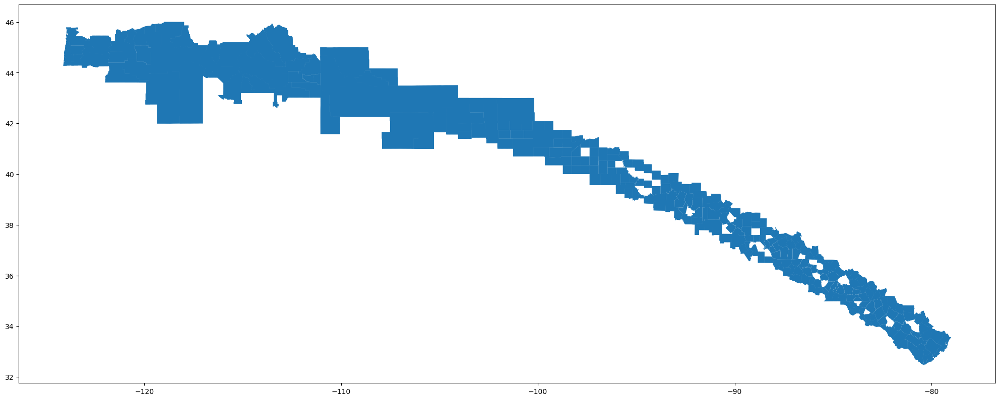

In [54]:
eclipse_clip.plot(figsize=(25,20))